In [2]:
import os
import math
import numpy as np
import pandas as pd
import pygmt
import pickle
import imageio
import xarray as xr
import numpy as np
from scipy.interpolate import interp1d
import pygplates
import seaborn as sns
import warnings
import rioxarray as rio
warnings.simplefilter("ignore")

import matplotlib.pyplot as plt
import cartopy.crs as ccrs

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

font = {'family' : 'Helvetica',
        'weight' : 'normal',
        'size'   : 10}
plt.rc('font', **font)

## Load Yanites data

In [3]:
data_df = pd.read_csv('data/41561_2015_BFngeo2429_MOESM588_ESM.csv')
# Get categories by ages
ages = data_df['Age (Ma)'].values
bins = [0,1.5,3,6,9,12,15,20,25,30,35,55,65]
labels = []
for x in range(1, len(bins)):
    labels.append('{}-{}'.format(bins[x-1],bins[x]))
binned = pd.cut(data_df['Age (Ma)'], bins=bins, labels=labels)
data_df['age cat'] = binned
data_df['age cat'] = data_df['age cat'].astype(dtype="category")
labels = list(data_df['age cat'].cat.categories)

savedata = data_df.copy()
data_df.head()

,Deposit number,Lat.,Long.,Age (Ma),Erosion rate (km/My),Ind. depth e-rate (km/My),Modern MAP (mm),Slope (o) (90m),Slope (o) (10km),Frequency,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,age cat
0,1,-27.371,-66.280,5.5,0.36,0.36,221.12,30.85,28.039921,4,NaN,NaN,NaN,NaN,NaN,NaN,3-6
1,2,-30.500,-69.750,12.0,0.17,0.00,145.96,15.04,19.502411,6,NaN,NaN,NaN,NaN,NaN,NaN,9-12
2,3,-27.267,-66.650,8.5,0.24,0.00,221.12,10.78,9.288019,4,NaN,NaN,NaN,NaN,NaN,NaN,6-9
3,4,-27.330,-66.609,7.5,0.27,0.34,221.12,5.75,13.384438,4,NaN,NaN,NaN,NaN,NaN,NaN,6-9
4,5,-27.400,-66.550,7.0,0.29,0.00,221.12,17.31,19.761951,4,NaN,NaN,NaN,NaN,NaN,NaN,6-9


#### Pick the mines you want to track:

In [4]:
#Load .csv for the desired mine

mine1 = 206 #93 #12 #The mine ID is equal mine index+1
mine2 = 43 #13 #47
mine3 = 57 #41 #203
mine4 = 190 #95


### Get elevation data from Boschman

Skip this part of the process if you already have the .csv files with all the data - jump to Load .csv files

In [5]:
BoschID_nc1 = xr.open_dataset('./ncSite2/site'+str(mine1)+'.nc')
BoschID_nc1 = BoschID_nc1.rename({'__xarray_dataarray_variable__': 'z'})

BoschID_nc2 = xr.open_dataset('./ncSite2/site'+str(mine2)+'.nc')
BoschID_nc2 = BoschID_nc2.rename({'__xarray_dataarray_variable__': 'z'})

BoschID_nc3 = xr.open_dataset('./ncSite2/site'+str(mine3)+'.nc')
BoschID_nc3 = BoschID_nc3.rename({'__xarray_dataarray_variable__': 'z'})

BoschID_nc4 = xr.open_dataset('./ncSite2/site'+str(mine4)+'.nc')
BoschID_nc4 = BoschID_nc4.rename({'__xarray_dataarray_variable__': 'z'})


In [6]:
BoschID_nc = []

for k in range(0, len(data_df) - 1):
    # Open the Bosch and LEM datasets for each index k
    bosch_data = xr.open_dataset('./ncSite2/site' + str(k) + '.nc')
    bosch_data = bosch_data.rename({'__xarray_dataarray_variable__': 'z'})
        
    # Append the datasets to the lists
    BoschID_nc.append(bosch_data)


In [7]:
# Define lists for each mine
lon_mine = [[] for _ in range(len(BoschID_nc))]
lat_mine = [[] for _ in range(len(BoschID_nc))]
z_mine = [[] for _ in range(len(BoschID_nc))]

# Loop through each mine's dataset
for k, dataset in enumerate(BoschID_nc):
    for j in range(len(dataset.age)):
        lon_mine[k].append(dataset.isel(age=j).lon.mean().values + 0.0)
        lat_mine[k].append(dataset.isel(age=j).lat.mean().values + 0.0)
        z_mine[k].append(dataset.isel(age=j).z.mean().values + 0.0)


In [8]:
mine_data = []

for k in range(len(BoschID_nc)):
    data_dict = {
        'lon_mine': lon_mine[k],
        'lat_mine': lat_mine[k],
        'z_mine': z_mine[k],
        'mineID': k
    }

    mine_df = pd.DataFrame(data_dict)
    mine_data.append(mine_df)


In [9]:
path = 'Mines_data/'
isExist = os.path.exists(path)
if not isExist:
    os.makedirs(path)

for k in range(len(mine_data)):
    file_name = os.path.join(path, f'bia_mine{k}_data.csv')  # Specify the full file path
    mine_data[k].to_csv(file_name, index=False)  # Save the DataFrame to a CSV file in the specified path

### Load .csv files

In [10]:
# Specify the file path for the CSV file
file_path1 = path + "mine"+str(mine1) + '_data.csv'
Bosch_siteID1 = pd.read_csv(file_path1)
LEM_siteID1 = xr.open_dataset('../copper_paper_plots/ncSite3/site'+str(mine1)+'.nc')


file_path2 = path + "mine"+str(mine2) + '_data.csv'
Bosch_siteID2 = pd.read_csv(file_path2)
LEM_siteID2 = xr.open_dataset('../copper_paper_plots/ncSite3/site'+str(mine2)+'.nc')


file_path3 = path + "mine"+str(mine3) + '_data.csv'
Bosch_siteID3 = pd.read_csv(file_path3)
LEM_siteID3 = xr.open_dataset('../copper_paper_plots/ncSite3/site'+str(mine3)+'.nc')

file_path4 = path + "mine"+str(mine4) + '_data.csv'
Bosch_siteID4 = pd.read_csv(file_path4)
LEM_siteID4 = xr.open_dataset('../copper_paper_plots/ncSite3/site'+str(mine4)+'.nc')

LEM_siteID4

<xarray.Dataset>
Dimensions:    (age: 20, pos: 81)
Coordinates:
    latitude   (age, pos) float64 ...
    longitude  (age, pos) float64 ...
  * age        (age) float64 0.0 5.0 10.0 15.0 20.0 ... 75.0 80.0 85.0 90.0 95.0
Dimensions without coordinates: pos
Data variables: (12/15)
    zsim       (age, pos) float64 ...
    erorate    (age, pos) float64 ...
    rain       (age, pos) float64 ...
    wfflux     (age, pos) float64 ...
    sflux      (age, pos) float64 ...
    basin      (age, pos) float64 ...
    ...         ...
    tcor       (age, pos) float64 ...
    slpcat     (age, pos) float64 ...
    surfcat    (age, pos) float64 ...
    hydrocat   (age, pos) float64 ...
    phydiv     (age, pos) float64 ...
    wflux      (age, pos) float64 ...
Attributes:
    title:          0Ma Physiographic Dataset
    summary:        Parameters calculated using goSPL (the Global Scalable Pa...
    project:        Paleo-physiography reconstruction
    institution:    Faculty of Science | School of Geosciences | The Universi...
    creator_url:    http://earthcolab.org
    creator_name:   Tristan Salles
    creator_email:  tristan.salles@sydney.edu.au
    license:        CC BY-NC-SA (Creative Common) - This license allows reuse...
    date_created:   Sat Oct  1 16:31:34 2022

In [11]:
#Elevation data from simulation - LEM
variables_to_keep = ['zsim']
filtered_ds = LEM_siteID1[variables_to_keep]
df = filtered_ds.to_dataframe()
elev_Simulation = df[['zsim']].reset_index()

elev_Sim = elev_Simulation.pivot(index='pos', columns='age').sort_index(axis=1, level=1)
# elev_Sim

In [12]:
#Elevation data from Scotese
variables_to_keep_2 = ['z']
filtered_ds2 = LEM_siteID1[variables_to_keep_2]
df2 = filtered_ds2.to_dataframe()
elevation_Scotese = df2[['z']].reset_index()
elev_Scotese = elevation_Scotese.pivot(index='pos', columns='age').sort_index(axis=1, level=1)
# elev_Scotese

In [13]:
# Assuming your dataset has a 'time' coordinate in millions of years

tvals = np.arange(0, 80, 5)

# Create lists to store elevation means
elv_mean_sim = [[] for _ in range(4)]
elv_mean_scotese = [[] for _ in range(4)]
# elv_means_boschman = [[] for _ in range(4)]

# Define your site and Bosch datasets as a list for easier iteration
sites = [LEM_siteID1, LEM_siteID2, LEM_siteID3, LEM_siteID4]
bosch_datasets = [Bosch_siteID1, Bosch_siteID2, Bosch_siteID3, Bosch_siteID4]

for t in tvals:
    t_ranges = [(site['age'] >= t) & (site['age'] < t + 5) for site in sites]
    # bt_ranges = [(bosch['age'] >= t) & (bosch['age'] < t + 5) for bosch in bosch_datasets]

    for i in range(4):
        # Values from Simulation
        mean_elevation_sim = sites[i]['zsim'][t_ranges[i]].mean().values
        elv_mean_sim[i].append(mean_elevation_sim)
    
        # Values from Scotese
        mean_elevation_scotese = sites[i]['z'][t_ranges[i]].mean().values
        elv_mean_scotese[i].append(mean_elevation_scotese)

    
# Now elv_means_sim, elv_means_scotese, and elv_means_boschman contain the results


In [14]:
Bosch_siteID2

,lon_mine,lat_mine,z_mine,mineID
0,-70.450000,-34.100000,2079.370824,43
1,-69.750000,-34.700000,2481.971385,43
2,-68.850000,-35.300000,1179.928875,43
3,-67.656667,-36.000000,-18000.000000,43
4,-66.543333,-36.700000,291.915428,43
5,-65.250000,-37.200000,115.209445,43
6,-63.850000,-38.000000,112.826484,43
7,-62.330000,-38.100000,290.197750,43
8,-60.946667,-38.200000,176.916761,43
9,-59.776667,-39.200000,-41.276070,43


In [15]:
mean_elev1 = pd.DataFrame({'age': tvals, 'Elev_Sim_Mean': elv_mean_sim[0], 'Elev_Scotese_Mean':elv_mean_scotese[0], 'Elev_Boschman_Mean':Bosch_siteID1.z_mine} )
mean_elev2 = pd.DataFrame({'age': tvals, 'Elev_Sim_Mean': elv_mean_sim[1], 'Elev_Scotese_Mean':elv_mean_scotese[1], 'Elev_Boschman_Mean':Bosch_siteID2.z_mine})
mean_elev3 = pd.DataFrame({'age': tvals, 'Elev_Sim_Mean': elv_mean_sim[2], 'Elev_Scotese_Mean':elv_mean_scotese[2], 'Elev_Boschman_Mean':Bosch_siteID3.z_mine})
mean_elev4 = pd.DataFrame({'age': tvals, 'Elev_Sim_Mean': elv_mean_sim[3], 'Elev_Scotese_Mean':elv_mean_scotese[3],'Elev_Boschman_Mean':Bosch_siteID4.z_mine})

mean_elev1

,age,Elev_Sim_Mean,Elev_Scotese_Mean,Elev_Boschman_Mean
0,0,2042.760005548007,2296.42862965377,2106.203601
1,5,1682.69577801015,1969.3000093300614,882.059131
2,10,2084.6737077038956,2367.3869735880216,2348.399801
3,15,1820.5066626494788,2078.1639757463795,583.786931
4,20,1712.5605105452266,1940.0723531394372,417.413401
5,25,1857.131461788399,2104.5830886539816,110.604758
6,30,2096.577399059749,2384.2842838209585,153.627997
7,35,1574.1558421142279,1767.0472906209363,197.835756
8,40,1709.7021980390234,1847.9386723243415,116.809255
9,45,1969.4581765960809,2165.035020548347,100.000000


##### Plot mean elevations from all the simulations for the specified mines

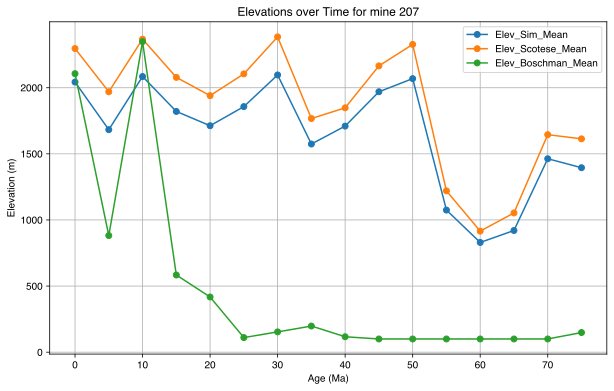

In [44]:
# Create your DataFrame (mean_elev) if you haven't already

# Convert 'age' and 'Elev_Sim_Mean' columns to numpy arrays
age = mean_elev1['age'].values
elev_sim_mean1 = mean_elev1['Elev_Sim_Mean'].values
elev_scotese_mean1 = mean_elev1['Elev_Scotese_Mean'].values
elv_mean_boschman1 = mean_elev1 ['Elev_Boschman_Mean'].values

elev_sim_mean2 = mean_elev2['Elev_Sim_Mean'].values
elev_scotese_mean2 = mean_elev2['Elev_Scotese_Mean'].values
elv_mean_boschman2 = mean_elev2 ['Elev_Boschman_Mean'].values

elev_sim_mean3 = mean_elev3['Elev_Sim_Mean'].values
elev_scotese_mean3 = mean_elev3['Elev_Scotese_Mean'].values
elv_mean_boschman3 = mean_elev3 ['Elev_Boschman_Mean'].values

elev_sim_mean4 = mean_elev4['Elev_Sim_Mean'].values
elev_scotese_mean4 = mean_elev4['Elev_Scotese_Mean'].values
elv_mean_boschman4 = mean_elev4 ['Elev_Boschman_Mean'].values



# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(age, elev_sim_mean1, marker='o', label='Elev_Sim_Mean')
plt.plot(age, elev_scotese_mean1, marker='o', label='Elev_Scotese_Mean')
plt.plot(age, elv_mean_boschman1, marker='o', label='Elev_Boschman_Mean')

# plt.plot(age, elev_scotese_mean1, marker='o', label='Elev_Sim_Mean')
plt.xlabel("Age (Ma)")
plt.ylabel("Elevation (m)")
plt.title("Elevations over Time for mine "+str(mine1+1))
plt.grid(True)
plt.legend()
plt.show()

In [17]:
# Convert the dataset to a DataFrame
df1 = LEM_siteID1.to_dataframe()
df2 = LEM_siteID2.to_dataframe()
df3 = LEM_siteID3.to_dataframe()
df4 = LEM_siteID4.to_dataframe()

# Create a new DataFrame with 'zsim', 'pos', and 'age' columns
new_df1 = df1[['z']].reset_index()
new_df2 = df2[['z']].reset_index()
new_df3 = df3[['z']].reset_index()
new_df4 = df4[['z']].reset_index()

# new_df1

In [18]:
# # Assuming your DataFrame is named df
reshaped_df1 = new_df1.pivot(index='pos', columns='age', values='z')
reshaped_df2 = new_df2.pivot(index='pos', columns='age', values='z')
reshaped_df3 = new_df3.pivot(index='pos', columns='age', values='z')
reshaped_df4 = new_df4.pivot(index='pos', columns='age', values='z')
# reshaped_df1


#### Load netcdfs from all the simulations to plot

In [19]:
# Read the NetCDF files using xarray
Li1 = xr.open_dataset('../physioLi/physio0Ma.nc')
Valdes1 = xr.open_dataset('../model2_VAldes/physio0Ma.nc')
Scotese = xr.open_dataset('../../2_Data/2_Paleoelevation/0Ma.nc')
mines_xr = xr.open_dataset('../copper_paper_plots/ncSite/site'+str(mine1)+'.nc')
Boschman = xr.open_dataset('./netcdf/0_Ma.nc')
Boschman = Boschman.rename({'__xarray_dataarray_variable__': 'z'})
# Boschman

In [20]:
data_df = pd.read_excel('data/41561_2015_BFngeo2429_MOESM588_ESM.xlsx')
mineID1 = data_df[data_df['Deposit number']-1 == mine1]
mineID2 = data_df[data_df['Deposit number']-1 == mine2]
mineID3 = data_df[data_df['Deposit number']-1 == mine3]
mineID4 = data_df[data_df['Deposit number']-1 == mine4]


SAsitesIDs = mineID1['Deposit number'].values-1
SAlat1, SAlon1 = mineID1['Lat.'].values, mineID1['Long.'].values 
SAlat2, SAlon2 = mineID2['Lat.'].values, mineID2['Long.'].values 
SAlat3, SAlon3 = mineID3['Lat.'].values, mineID3['Long.'].values 
SAlat4, SAlon4 = mineID4['Lat.'].values, mineID4['Long.'].values 

# mineID1, mineID2, mineID3, mineID4
SAlat1, SAlon1

(array([-4.9444]), array([-79.308]))

### Plot mine locations

grdcontour [WARNING]: Longitude range too small; geographic boundary condition changed to natural.


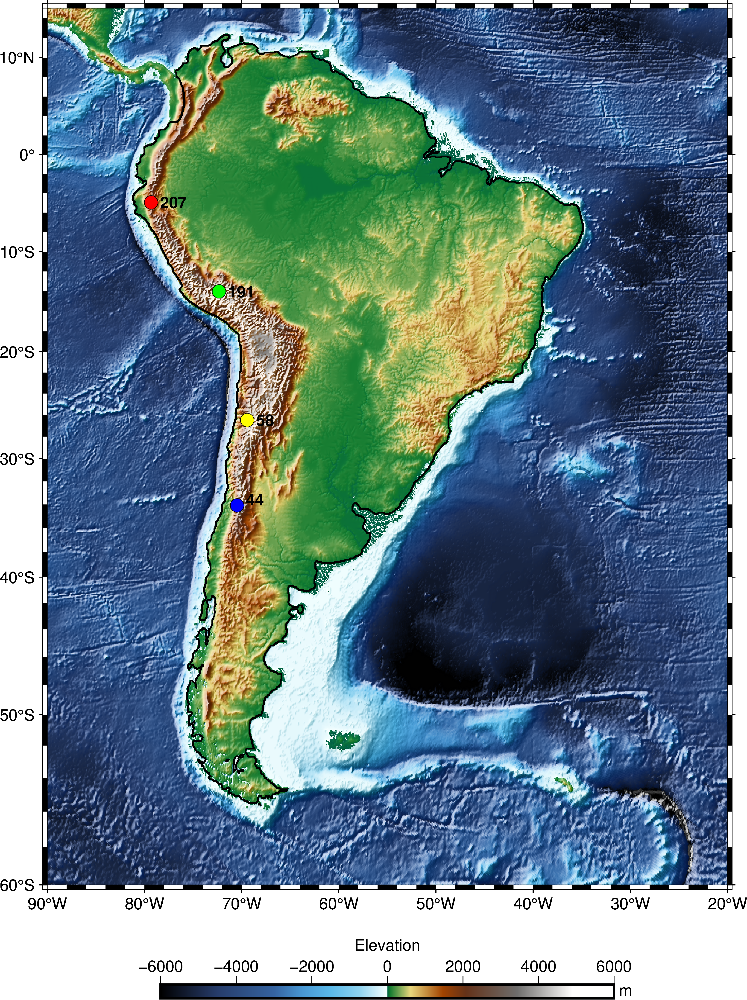

In [21]:
# Define the region
region = [-90, -20, -60, 15]

# Create a PyGMT figure
fig = pygmt.Figure()

# Configure the figure
with pygmt.config(FONT='10p,Helvetica,black'):
    # Create a color palette (cmap) and set the contour interval
    pygmt.makecpt(cmap="geo", series=[-6000, 6000])
    
    # Create a basemap with specified region, projection, and frame
    fig.basemap(region=region, projection='M15c', frame='a')
    
    # Plot the grdimage with shading
    fig.grdimage(Valdes1.z, shading=True, frame=True)
    
    # Add contour lines
    fig.grdcontour(
        interval=0.1,
        grid=Boschman.z,
        limit=[-0.1, 0.1],
        pen='1p'
    )
    
    # Add a color scale
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h")
    # Time interval
    # fig.text(text="Mine ID "+ str(mine+1), position="BL", font="12p,Helvetica-Bold,white")

# Plot points and add labels
fig.plot(x=SAlon1, y=SAlat1, style='c0.3c', color='red', pen='black')
fig.plot(x=SAlon2, y=SAlat2, style='c0.3c', color='blue', pen='black')
fig.plot(x=SAlon3, y=SAlat3, style='c0.3c', color='yellow', pen='black')
fig.plot(x=SAlon4, y=SAlat4, style='c0.3c', color='green', pen='black')

# Add labels to the points
fig.text(x=SAlon1,y=SAlat1, text='  '+str(mine1+1), justify='LM', font='10p,Helvetica-Bold,black')
fig.text(x=SAlon2, y=SAlat2, text='  '+str(mine2+1)+'   ', justify='LB', font='10p,Helvetica-Bold,black')
fig.text(x=SAlon3, y=SAlat3, text='  '+str(mine3+1), justify='LM', font='10p,Helvetica-Bold,black')
fig.text(x=SAlon4, y=SAlat4, text='  '+str(mine4+1), justify='LM', font='10p,Helvetica-Bold,black')

fig.savefig("Mines_Location_7Nov.pdf")   
# Show the plot
fig.show(dpi=500, width=600)


### Plot Elevation over time for the mines from all simulations

#### For one mine initially:

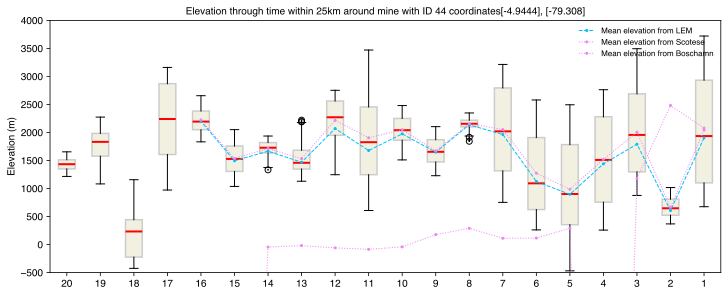

In [22]:

# Create the figure and axes
fig, ax = plt.subplots(1, 1, figsize=(10, 4), constrained_layout=True)

# Box plot for average elevations
ax.boxplot(reshaped_df2,
           vert=True, patch_artist=True,
           boxprops=dict(facecolor='darkkhaki', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
           medianprops=dict(color='red', linestyle='-', linewidth=2),
           flierprops=dict(linestyle='-', linewidth=1.5),
           whiskerprops=dict(linestyle='-', linewidth=1),
           capprops=dict(linestyle='-', linewidth=1),
           zorder=1)

# Customize the plot (titles, labels, legend, etc.)
# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")

# Plot elev_sim_mean with the same time steps
# plt.plot((time_intervals/5)+1, elev_sim_mean, marker='o', label='Elev_Sim_Mean', linestyle='-')
# plt.plot((time_intervals/5)+1, elev_scotese_mean, marker='o', label='Elev_Scotese_Mean', linestyle='-')

plt.plot((tvals/5+1), elev_sim_mean2, marker='o', label='Mean elevation from LEM', linestyle='--',  color='deepskyblue', markersize=2, linewidth=1)
plt.plot((tvals/5+1), elev_scotese_mean2, marker='o', label='Mean elevation from Scotese', linestyle=':', color='violet', markersize=2, linewidth=1)
plt.plot((tvals/5+1), elv_mean_boschman2, marker='o', label='Mean elevation from Boschamn', linestyle=':', color='violet', markersize=2, linewidth=1)


# Reverse the x-axis
plt.gca().invert_xaxis()
x_axis = ax.axes.get_xaxis()
ax.set_ylim(-500, 4000)
ax.set_ylabel('Elevation (m)')
# ax.set_yscale('log')  # You can change the scale as needed
plt.title('Elevation through time within 25km around mine with ID '+str(mine2+1)+' coordinates'+str(SAlat1)+', '+str(SAlon1), fontsize=10)
plt.legend(fontsize=8, frameon=False, loc=1)

# Save the plot as an image
plt.savefig('average_elevation'+str(mine2+1)+'.svg', transparent=True, dpi=600)

# Show the plot (if needed)
plt.show()


#### Plot dataset in full extension

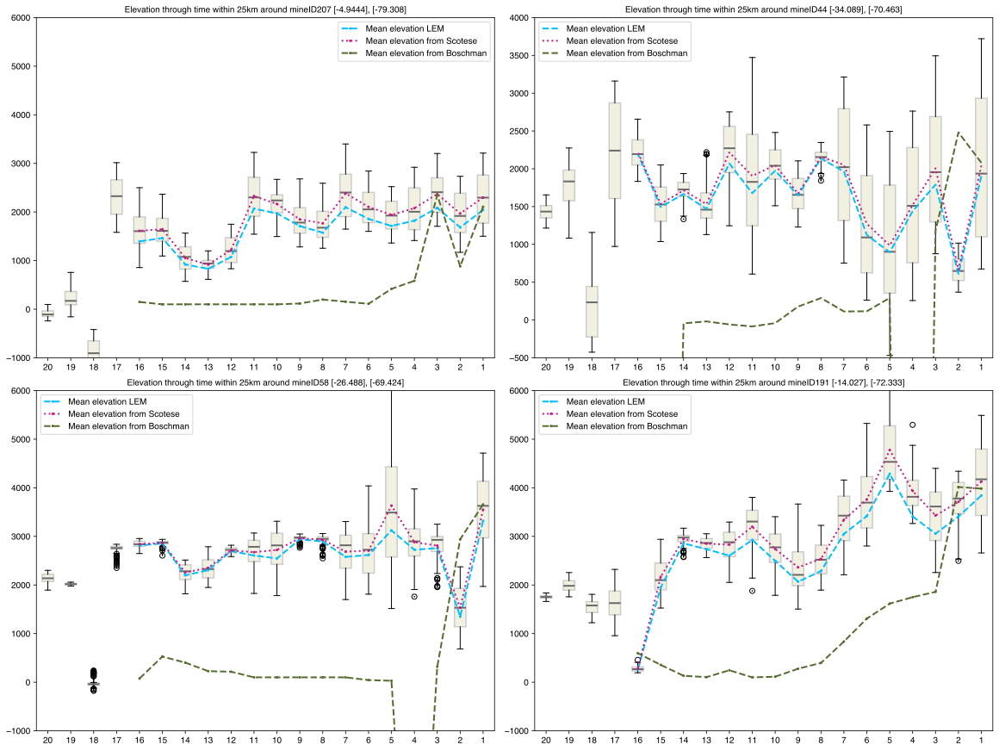

In [23]:
# Create the figure and axes
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12), constrained_layout=True)

# Box plot for the first subplot (ax1)
ax1.boxplot(reshaped_df1,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='darkkhaki', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgray', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)

# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax1.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax1.plot((tvals/5+1), elev_sim_mean1, marker='o', label='Mean elevation LEM', linestyle='--',  color='deepskyblue', markersize=2, linewidth=2)
ax1.plot((tvals/5+1), elev_scotese_mean1, marker='o',  label='Mean elevation from Scotese', linestyle=':', color='mediumvioletred', markersize=2, linewidth=2)
ax1.plot((tvals/5+1), elv_mean_boschman1, marker='o',  label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis1 = ax1.axes.get_xaxis()
ax1.invert_xaxis()
ax1.set_title('Elevation through time within 25km around mineID'+str(mine1+1)+' '+str(SAlat1)+', '+str(SAlon1), fontsize=10)
ax1.set_ylim(-1000, 6000) # Change the limits as needed
ax1.legend()

# Box plot for the second subplot (ax2)
ax2.boxplot(reshaped_df2,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='darkkhaki', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgray', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)

# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax2.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax2.plot((tvals/5+1), elev_sim_mean2,  label='Mean elevation LEM', linestyle='--',  color='deepskyblue', markersize=2, linewidth=2)
ax2.plot((tvals/5+1), elev_scotese_mean2,  label='Mean elevation from Scotese', linestyle=':', color='mediumvioletred', markersize=2, linewidth=2)
ax2.plot((tvals/5+1), elv_mean_boschman2, label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis2 = ax2.axes.get_xaxis()
ax2.invert_xaxis()
ax2.set_title('Elevation through time within 25km around mineID'+str(mine2+1)+' '+str(SAlat2)+', '+str(SAlon2), fontsize=10)
ax2.set_ylim(-500, 4000)
ax2.legend()

# Box plot for the third subplot (ax3)
ax3.boxplot(reshaped_df3,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='darkkhaki', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgray', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)
# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax3.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax3.plot((tvals/5+1), elev_sim_mean3, marker='o',  label='Mean elevation LEM', linestyle='--',  color='deepskyblue', markersize=2, linewidth=2)
ax3.plot((tvals/5+1), elev_scotese_mean3, marker='o',  label='Mean elevation from Scotese', linestyle=':', color='mediumvioletred', markersize=2, linewidth=2)
ax3.plot((tvals/5+1), elv_mean_boschman3, marker='o',  label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis3 = ax3.axes.get_xaxis()
ax3.invert_xaxis()
ax3.set_title('Elevation through time within 25km around mineID'+str(mine3+1)+' '+str(SAlat3)+', '+str(SAlon3), fontsize=10)
ax3.set_ylim(-1000, 6000)
ax3.legend()

# Box plot for the fourth subplot (ax4)
ax4.boxplot(reshaped_df4,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='darkkhaki', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgray', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)
# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax4.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax4.plot((tvals/5+1), elev_sim_mean4, marker='o', label='Mean elevation LEM', linestyle='--',  color='deepskyblue', markersize=2, linewidth=2)
ax4.plot((tvals/5+1), elev_scotese_mean4, marker='o', label='Mean elevation from Scotese', linestyle=':', color='mediumvioletred', markersize=2, linewidth=2)
ax4.plot((tvals/5+1), elv_mean_boschman4, marker='o', label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis4 = ax4.axes.get_xaxis()
ax4.invert_xaxis()
ax4.set_title('Elevation through time within 25km around mineID'+str(mine4+1)+' '+str(SAlat4)+', '+str(SAlon4), fontsize=10)
ax4.set_ylim(-1000, 6000)
ax4.legend()

# You can further customize the subplots, labels, titles, etc.

# # Save the plot as an image
# plt.savefig('combined_ElevationxTime_radius1_25km.png', transparent=False, dpi=300)
plt.savefig('ElevationxTime_mines_'+str(mine1+1)+'_'+str(mine2+1)+'_'+str(mine3+1)+'_'+str(mine4+1)+'.svg', transparent=False, dpi=300)
plt.savefig('ElevationxTime_mines_'+str(mine1+1)+'_'+str(mine2+1)+'_'+str(mine3+1)+'_'+str(mine4+1)+'.png', transparent=False, dpi=300)


# # Show the plot (if needed)
plt.show()


## Plot mines location over time
### Load dataset from Yanites

#### Choose which netcdf to plot
#### Here using Boschman data

In [24]:
for k in range(0,85,5):
    testz = rio.open_rasterio('../Data_Boschman/4.rasters_reconstruction_PREFERRED/'+str(k)+'_Ma.grd').isel(band=0)

    testz = testz.rename({'x': 'lon'})
    testz = testz.rename({'y': 'lat'})
    testz 

    da = xr.DataArray(
        testz.values,
        coords=[testz.lat.values, testz.lon.values],
        dims=["lat", "lon"],
    )
    
    # da.to_netcdf('test_bia_new_Fri'+str(k)+'.nc')

In [25]:
step = 80
ds1 = xr.open_dataset('test'+str(k)+'.nc')

In [26]:
Scotese1 = xr.open_dataset('../../2_Data/2_Paleoelevation/'+str(step)+'Ma.nc')
Scotese1

<xarray.Dataset>
Dimensions:    (latitude: 1801, longitude: 3601)
Coordinates:
  * latitude   (latitude) float64 90.0 89.9 89.8 89.7 ... -89.8 -89.9 -90.0
  * longitude  (longitude) float64 -180.0 -179.9 -179.8 ... 179.8 179.9 180.0
Data variables:
    z          (latitude, longitude) float32 ...
Attributes:
    description:  PALEOMAP:Late_Cretaceous, 80.8 Ma
    history:      Created Wed Nov 22 16:39:02 2017

grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline


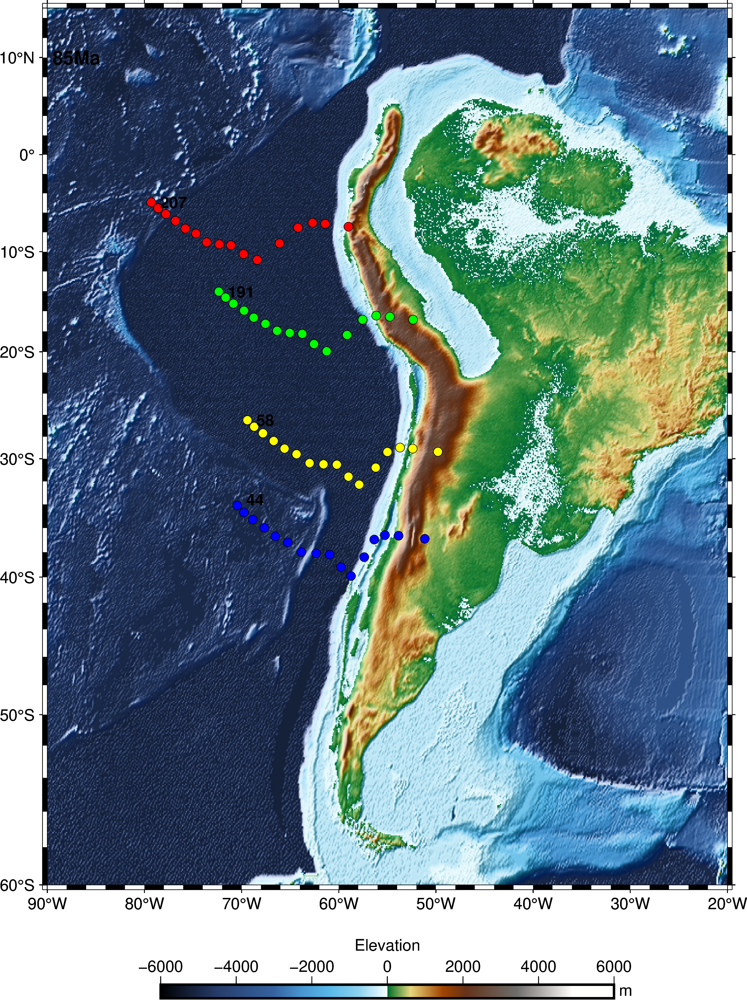

In [27]:
# Define the region
region = [-90, -20, -60, 15]

# Create a PyGMT figure
fig = pygmt.Figure()

# Configure the figure
with pygmt.config(FONT='10p,Helvetica,black'):
    # Create a color palette (cmap) and set the contour interval
    pygmt.makecpt(cmap="geo", series=[-6000, 6000])
    
    # Create a basemap with specified region, projection, and frame
    fig.basemap(region=region, projection='M15c', frame='a')
    
    # Plot the grdimage with shading
    fig.grdimage(Scotese1.z, shading=True, frame=True)
    # fig.grdimage(ds1.__xarray_dataarray_variable__, shading=True, frame=True)   
     
    # Add a color scale
    fig.colorbar(frame=["a2000", "x+lElevation", "y+lm"], position="jBC+o0c/-2.5c+w10c/0.3c+h")
    # Time interval
fig.text(text= str(step+5)+'Ma', x=-87, y=10, font="12p,Helvetica-Bold,black")

# # Plot points and add labels
fig.plot(x=Bosch_siteID1.lon_mine,  y=Bosch_siteID1.lat_mine, style='c0.2c', color='red', pen='black')
fig.plot(x=Bosch_siteID2.lon_mine,  y=Bosch_siteID2.lat_mine, style='c0.2c', color='blue', pen='black')
fig.plot(x=Bosch_siteID3.lon_mine,  y=Bosch_siteID3.lat_mine, style='c0.2c', color='yellow', pen='black')
fig.plot(x=Bosch_siteID4.lon_mine,  y=Bosch_siteID4.lat_mine, style='c0.2c', color='green', pen='black')

# Add labels to the points
fig.text(x=Bosch_siteID1.lon_mine[0], y=Bosch_siteID1.lat_mine[0], text='  '+str(mine1+1), justify='LM', font='10p,Helvetica-Bold,black')
fig.text(x=Bosch_siteID2.lon_mine[0], y=Bosch_siteID2.lat_mine[0], text='  '+str(mine2+1)+'   ', justify='LB', font='10p,Helvetica-Bold,black')
fig.text(x=Bosch_siteID3.lon_mine[0], y=Bosch_siteID3.lat_mine[0], text='  '+str(mine3+1), justify='LM', font='10p,Helvetica-Bold,black')
fig.text(x=Bosch_siteID4.lon_mine[0], y=Bosch_siteID4.lat_mine[0], text='  '+str(mine4+1), justify='LM', font='10p,Helvetica-Bold,black')

# fig.savefig("Boschamn_Mines_Time.png")   
# Show the plot
fig.show(dpi=500, width=600)


#### Here using Scotese/LEM data

In [28]:
filter1 = data_df[(data_df['Long.'] > -90) & (data_df['Long.'] < -30) ]
filter2 = filter1[(filter1['Lat.'] > -60) & (filter1['Lat.'] < 3) ]

In [29]:
# Flat lat/lon array.
SAlat = filter2['Lat.'].values
SAlon = filter2['Long.'].values 

MovingPlate = 201
RelativePlate = 1
TimeStep = 5
times = np.arange(0,101,float(TimeStep))

rotation_filename = 'data/PALEOMAP_PlateModel.rot'

def getTrailPts(lat,lon):
    
    # Create the motion path feature
    digitisation_time = 0
    seed_points_at_digitisation_time = pygplates.MultiPointOnSphere([(lat, lon)])
    motion_path_feature = pygplates.Feature.create_motion_path(
            seed_points_at_digitisation_time,
            times,
            valid_time=(200., 0.),
            relative_plate=RelativePlate,
            reconstruction_plate_id = MovingPlate)

    rotation_model = pygplates.RotationModel(rotation_filename)

    # Create the shape of the motion path
    reconstruction_time = 0
    reconstructed_motion_paths = []
    pygplates.reconstruct(
            motion_path_feature, rotation_model, reconstructed_motion_paths, reconstruction_time,
            reconstruct_type=pygplates.ReconstructType.motion_path)

    for reconstructed_motion_path in reconstructed_motion_paths:
        trail = reconstructed_motion_path.get_motion_path().to_lat_lon_array()
    
    x, y = np.flipud(trail[:,1]), np.flipud(trail[:,0])
    
    return np.flipud(trail[:,1]), np.flipud(trail[:,0])


allTrail = []
for k in range(len(SAlat)):
    lonlatTime = getTrailPts(SAlat[k], SAlon[k])
    allTrail.append(lonlatTime)

In [30]:
step = 0

out = '../copper_paper_plots/model1_Valdes/'
dataset = xr.open_dataset(out+'data'+str(step)+'Ma.nc')

In [31]:
def GetModelData(dataset,timestep):
    
    elevPts = []
    rainPts = []
    erodepPts = []
    upliftPts = []
    for pt in range(len(SAlat)):
        lonPt = allTrail[pt][0]
        latPt = allTrail[pt][1]
        ptdata = dataset.sel(latitude=latPt[timestep], longitude=lonPt[timestep], method='nearest')
        elevPts.append(ptdata.elevation.values.tolist())
        rainPts.append(ptdata.precipitation.values.tolist())
        erodepPts.append(ptdata.erodep.values.tolist())
        upliftPts.append(ptdata.uplift.values.tolist())
        
    dataframe = pd.DataFrame(elevPts, columns=['elev'])
    dataframe['rain'] = rainPts
    dataframe['erodep'] = erodepPts
    dataframe['uplift'] = upliftPts
    
    return dataframe

modelData = []
for k in range(len(times)-1):
    ncdata = xr.open_dataset(out+'data'+str(int(times[k]))+'Ma.nc')
    modelData.append(GetModelData(ncdata,k))

In [32]:
def getDepositCharacteristics(modelData,ages,depnb):

    age = ages[depnb]
    modage = age%5.

    step = int(age/5.)
    if modage > 0:
        step += 1

    depZ = []
    depED = []
    depRain = []
    depTime = []
    depExhum = []
    for s in range(step+1):
        if s == step and modage>0:
            frac = 1.-modage/5.
            valZ = modelData[s]['elev'][depnb]
            valED = modelData[s]['erodep'][depnb]
            depZ.append(frac*(depZ[-1]-valZ)+valZ)
            depED.append(frac*(depED[-1]-valED)+valED)
            depTime.append(age)
        else:
            depZ.append(modelData[s]['elev'][depnb])
            depED.append(modelData[s]['erodep'][depnb])
            depTime.append(s*5.)
        depRain.append(modelData[s]['rain'][depnb])
    for s in range(step): 
        # in km/Myr
        depExhum.append(-(depED[s]-depED[s+1])*1.e-3/((depTime[s+1]-depTime[s])))
    depExhum.append(0.)

    dep_df = pd.DataFrame(depZ, columns=['elev'])
    dep_df['erodep'] = depED-depED[-1]
    dep_df['exhrate'] = depExhum
    dep_df['rain'] = depRain
    dep_df['time'] = depTime

    return dep_df

depVars = []
ages = filter2['Age (Ma)'].values
for k in range(len(modelData[0])):
    depVars.append(getDepositCharacteristics(modelData,ages,k))

In [33]:
def plotVariables(depLocNb, plotter=0):
    
    tmp_df = depVars[depLocNb].copy()
    
    tmp_df = tmp_df.iloc[:-1]
    
    if len(tmp_df)>3:
        f1 = interp1d(tmp_df['time'], tmp_df['exhrate'],kind='cubic')
        new_index = np.arange(tmp_df['time'][0],tmp_df['time'][len(tmp_df)-1]+0.5,0.5)
        tmp_df2 = pd.DataFrame()
        tmp_df2['time'] = new_index
        tmp_df2['exhrate'] = f1(new_index)
    else:
        tmp_df2 = pd.DataFrame()
        tmp_df2['time'] = tmp_df['time'].values
        tmp_df2['exhrate'] = tmp_df['exhrate'].values
    
    if plotter==0:
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(8,4.5),constrained_layout = True) #,gridspec_kw={'width_ratios': [1.5, 1]})
    else:
        fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(8,2.5),constrained_layout = True) 
    
    # Left figure
    colors = tmp_df.exhrate.values
    tmp_df2.plot(x="time", y="exhrate", ax=ax1, 
            kind="line", lw=1.5, c='black',zorder=2,legend=False)
    tmp_df.plot.scatter(x="time", y="exhrate", ax=ax1, marker='o',
                       s=35, c = colors, colorbar=False,
                        edgecolors='black',zorder=3)
    ax1.set_xlabel('Deposit age (Myr)')
    ax1.set_ylabel('Exhumation rate \n (km/Myr)')
    ax1.grid(axis='y',zorder=0,alpha=0.3)
    
    if plotter==0:
        ax1.xaxis.tick_top()
        ax1.xaxis.set_label_position('top') 
    
    # Right figure
    exhon = tmp_df[tmp_df['exhrate'] > 0]  
    exhon.boxplot(column=['exhrate'], return_type='axes',
                    patch_artist=True,
                    ax=ax2, vert=False, grid=False,
                    boxprops=dict(facecolor='LightGrey',color='Black',linestyle='-', linewidth=1.5),
                    medianprops=dict(color='Black',linestyle='-', linewidth=2),
                    flierprops=dict(linestyle='-', linewidth=1.5),
                    whiskerprops=dict(linestyle='-', linewidth=1.5),
                    capprops=dict(linestyle='-', linewidth=1.5),
                   )
    ax2.set_title('')

    exrate = np.mean(exhon.exhrate.values[:-1])
    legend = ('Predicted depth '+str(np.round(-depVars[depLocNb].erodep.values[0]/1000.,3))+
              ' km \n' + 'Mean exhumation rate '+str(np.round(exrate,3))+' km/Myr \n'+
              'Erosion rate (dataset) '+str(np.round(filter2['Erosion rate (km/My) '].values[depLocNb],3))+' km/Myr '
             )

    ax2.text(0.99, 0.95, legend, 
             size=10, color='black',horizontalalignment='right',
             verticalalignment='top',
             transform = ax2.transAxes)

    y_axis = ax2.axes.get_yaxis()
    y_axis.set_visible(False)
    
    if plotter==0:
        ax2.xaxis.tick_top()
        ax2.xaxis.set_label_position('top') 
    
    ax2.set_xlabel('Exhumation rate (km/Myr)')
    plt.suptitle('Current longitude:'+str(np.round(filter2['Long.'].values[depLocNb],2))+
                 ' latitude:'+str(np.round(filter2['Lat.'].values[depLocNb],2)),
                 fontsize=11
                )
    tmp_df = depVars[depLocNb].copy()
    
    if len(tmp_df)>3:
        f1 = interp1d(tmp_df['time'], tmp_df['rain'],kind='cubic')
        new_index = np.arange(tmp_df['time'][0],tmp_df['time'][len(tmp_df)-1],0.1)
        tmp_df3 = pd.DataFrame()
        tmp_df3['time'] = new_index
        tmp_df3['rain'] = f1(new_index)
    else:
        tmp_df3 = pd.DataFrame()
        tmp_df3['time'] = tmp_df['time'].values
        tmp_df3['rain'] = tmp_df['rain'].values

    if plotter==0:
        # Left figure
        colors = tmp_df.rain.values
        tmp_df3.plot(x="time", y="rain", ax=ax3, 
                kind="line", lw=1.5, c='black',zorder=2,legend=False)
        tmp_df.plot.scatter(x="time", y="rain", ax=ax3, marker='o',
                           s=35, c = colors, cmap='plasma',colorbar=False,
                            edgecolors='black',zorder=3)
        ax3.set_xlabel('Deposit age (Myr)')
        ax3.set_ylabel('Average precipitation \n (m/yr)')
        ax3.grid(axis='y',zorder=0,alpha=0.3)
        # Right figure
        tmp_df3.boxplot(column=['rain'], return_type='axes',
                        patch_artist=True,
                        ax=ax4, vert=False, grid=False,
                        boxprops=dict(facecolor='LightGrey',color='Black',linestyle='-', linewidth=1.5),
                        medianprops=dict(color='Black',linestyle='-', linewidth=2),
                        flierprops=dict(linestyle='-', linewidth=1.5),
                        whiskerprops=dict(linestyle='-', linewidth=1.5),
                        capprops=dict(linestyle='-', linewidth=1.5),
                       )
        ax4.set_title('')

        legend = ('Predicted average rainfall '+str(np.round(depVars[depLocNb].rain.mean(),3))+
                  ' m/yr \n' + 'Modern predicted rainfall '+str(np.round(depVars[depLocNb].rain.values[0],3))+' m/yr' #  \n' +
#                   'Modern rainfall (dataset) '+str(np.round(filter2['Modern MAP (mm)'].values[depLocNb]/1000.,3))+' m/yr '+
                 )

        ax4.text(0.99, 0.95, legend, 
                 size=10, color='black',horizontalalignment='right',
                 verticalalignment='top',
                 transform = ax4.transAxes)

        y_axis = ax4.axes.get_yaxis()
        y_axis.set_visible(False)
        ax4.set_xlabel('Average precipitation (m/yr)')
    plt.suptitle('Current longitude:'+str(np.round(filter2['Long.'].values[depLocNb],2))+
                 ' latitude:'+str(np.round(filter2['Lat.'].values[depLocNb],2)),
                 fontsize=11
                )
    if plotter == 0:
        plt.savefig('all'+str(depLocNb)+'.pdf')
    else:
        plt.savefig('dep'+str(depLocNb)+'.pdf')
    
    plt.show()
    return

### depLoc is different than the mineID - needs to be converted


In [34]:
mineID = pd.read_csv('./mineIDs.csv')

In [35]:
# Assuming data_df and mineID are defined
print(mine1+1, mine2+1, mine3+1, mine4+1)


207 44 58 191


In [36]:
# Assuming you have a DataFrame named 'mineID' containing mine information
# and 'data_df' containing deposit information

# Define a tolerance for latitude and age matching
lat_tolerance = 0.01  # Adjust this value as needed for your precision requirements
age_tolerance = 1.0   # Adjust this value as needed for your precision requirements

# Initialize empty lists to store matching information
matching_deposits = []
matching_lats = []
matching_lons = []
matching_mine_ids = []

# Iterate through each row in mineID
for index, row in mineID.iterrows():
    lat = row['lat']
    age = row['age']

    # Check if there are deposits in data_df that match the latitude and age
    matching_rows = data_df[
        (abs(data_df['Lat.'] - lat) <= lat_tolerance) &
        (abs(data_df['Age (Ma)'] - age) <= age_tolerance)
    ]

    # If matching deposits are found, add them to the lists
    if not matching_rows.empty:
        matching_deposits.extend(matching_rows['Deposit number'].tolist())
        matching_lats.extend([lat] * len(matching_rows))
        matching_lons.extend([row['lon']] * len(matching_rows))
        matching_mine_ids.extend([row['mineID']] * len(matching_rows))

# Create a DataFrame from the matching information
matching_df = pd.DataFrame({
    'MineID': matching_mine_ids,
    'Depositnumber': matching_deposits,
    'Latitude': matching_lats,
    'Longitude': matching_lons
})

# Display the resulting DataFrame
# print(matching_df)

In [37]:
depLoc1 = matching_df[matching_df['Depositnumber'] == mine1 + 1][['MineID']]
depLoc2 = matching_df[matching_df['Depositnumber'] == mine2 + 1][['MineID']]
depLoc3 = matching_df[matching_df['Depositnumber'] == mine3 + 1][['MineID']]
depLoc4 = matching_df[matching_df['Depositnumber'] == mine4 + 1][['MineID']]

In [38]:
# Create a list to store depLoc dataframes
depLocs = [depLoc1, depLoc2, depLoc3, depLoc4]

# Initialize variables for depLoc1 to depLoc4
depLoc1_int, depLoc2_int, depLoc3_int, depLoc4_int = None, None, None, None

# Loop through depLoc dataframes and convert the values
for i, depLoc in enumerate(depLocs):
    if not depLoc.empty:
        mine_id_as_str = depLoc['MineID'].values[0]
        try:
            mine_id_as_int = int(mine_id_as_str)
            if i == 0:
                depLoc1_int = mine_id_as_int
            elif i == 1:
                depLoc2_int = mine_id_as_int
            elif i == 2:
                depLoc3_int = mine_id_as_int
            elif i == 3:
                depLoc4_int = mine_id_as_int
        except ValueError:
            print(f"MineID for depLoc{i + 1} cannot be converted to an integer:", mine_id_as_str)
    else:
        print(f"No matching MineID found for depLoc{i + 1}.")

# Print the converted mine IDs for depLoc1 to depLoc4
print("Converted Mine IDs:")
print("depLoc1:", depLoc1_int)
print("depLoc2:", depLoc2_int)
print("depLoc3:", depLoc3_int)
print("depLoc4:", depLoc4_int)


Converted Mine IDs:
depLoc1: 82
depLoc2: 27
depLoc3: 41
depLoc4: 66


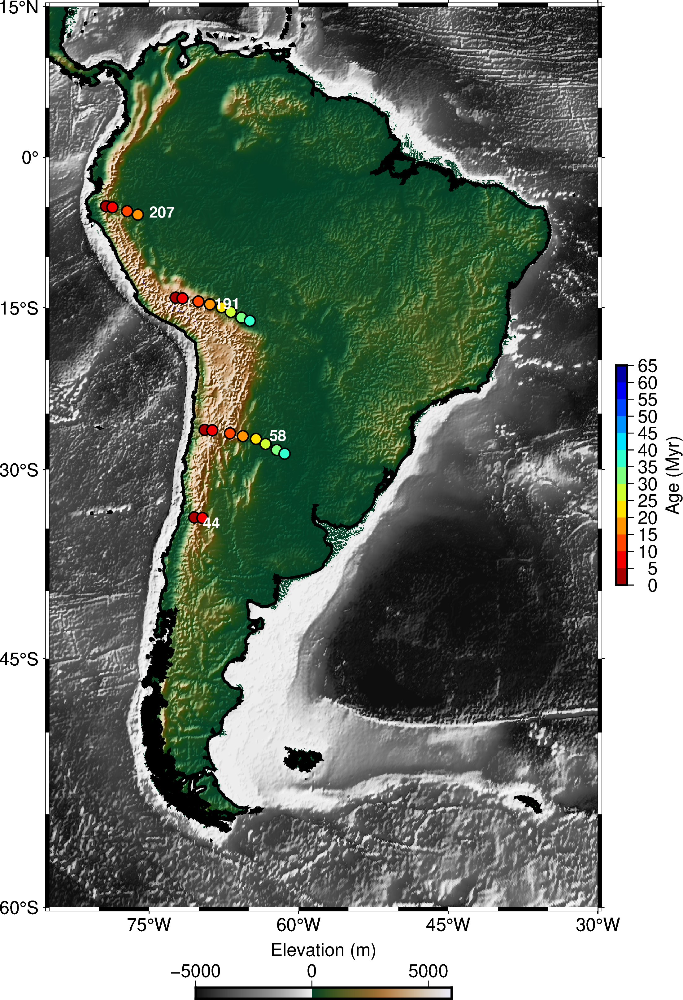

In [39]:
Li1 = xr.open_dataset('../physioLi/physio0Ma.nc')

#FRom south to north
# plotVariables(depLoc1,plotter=1)

# first mine
depLoc1 = depLoc1_int

rcdNb1 = len(depVars[depLoc1])-1
lonDep1 = allTrail[depLoc1][0][:rcdNb1]
latDep1 = allTrail[depLoc1][1][:rcdNb1]

#second mine 

depLoc2 = depLoc2_int
# plotVariables(depLoc2,plotter=1)  
depVars[depLoc2]

rcdNb2 = len(depVars[depLoc2])-1
lonDep2 = allTrail[depLoc2][0][:rcdNb2]
latDep2 = allTrail[depLoc2][1][:rcdNb2]

#third mine 

depLoc3 = depLoc3_int
# plotVariables(depLoc3,plotter=1)
depVars[depLoc3]

rcdNb3 = len(depVars[depLoc3])-1
lonDep3 = allTrail[depLoc3][0][:rcdNb3]
latDep3 = allTrail[depLoc3][1][:rcdNb3]

#foruth mine 
depLoc4 = depLoc4_int
# plotVariables(depLoc4,plotter=1)
depVars[depLoc4]

rcdNb4 = len(depVars[depLoc4])-1
lonDep4 = allTrail[depLoc4][0][:rcdNb4]
latDep4 = allTrail[depLoc4][1][:rcdNb4]


# grid = pygmt.datasets.load_earth_relief('10m', registration="gridline")

region = [-85, -30, -60, 15]

fig = pygmt.Figure()
with pygmt.config(FONT='14p,Helvetica,black'):

    fig.basemap(region=region, projection='M15c', frame='afg')
    pygmt.makecpt(cmap="fes", series=[-5000, 6000])
    fig.grdimage(Li1.z, shading=True, frame=True)
    fig.coast(shorelines=["1/2p,black"])
    fig.colorbar(position="jBC+o0c/-2.5c+w7c/0.3c+h",frame=["a5000", "x+lElevation (m)"])

    
    pygmt.makecpt(cmap="jet", series=[0, 65, 5], reverse=True)  # Original color scale
######
    fig.plot(x=lonDep1,
        y=latDep1,
        color=times[:len(latDep1)],
        # color='black',
        cmap=True,
        style="c0.3c",
        pen="1p,black") 
#####
    fig.plot(
        x=lonDep2,
        y=latDep2,
        color=times[:len(latDep2)],
        cmap=True,
        style="c0.3c",
        pen="1p,black")
######
    fig.plot(x=lonDep3,
        y=latDep3,
        color=times[:len(latDep3)],
        cmap=True,
        style="c0.3c",
        pen="1p,black")
    ######   
    fig.plot(x=lonDep4,
        y=latDep4,
        color=times[:len(latDep4)],
        cmap=True,
        style="c0.3c",
        pen="1p,black")

    fig.text(x=lonDep1[0], y=latDep1[0], text='          '+str(mine1+1)+'      ', justify='LT', font='12p,Helvetica-Bold,white')#, halo='white,1p')
    fig.text(x=lonDep2[0], y=latDep2[0], text='  '+str(mine2+1)+'      ', justify='LT', font='12p,Helvetica-Bold,white')
    fig.text(x=lonDep3[0], y=latDep3[0], text='               '+str(mine3+1)+'  ', justify='LT', font='12p,Helvetica-Bold,white')
    fig.text(x=lonDep4[0], y=latDep4[0], text='         '+str(mine4+1)+'   ', justify='LT', font='12p,Helvetica-Bold,white')
    
    fig.colorbar(position='JMR+o0.5c/-0.5c+w6c/0.3c',frame=["a5", "x+lAge (Myr)"])
    # fig.savefig("mine_elevations_time_31Oct.svg")
    # fig.savefig("Mine_Location_31Oct.png")
    fig.savefig("Mine_Location_9Nov.pdf")
    
#     fig.text(text="Age (Myr)", position="TR", xshift="2.6c", yshift="-8.1c")

fig.show(width=600)

## Plotting data obtained using Reconstructed Geometries

In [40]:
allminedataB_pd = pd.read_csv('./all_dataBoschman.csv')
allminedataB_pd

,Lon,Lat,Elevation,Age,Deposit number
0,-66.2800,-27.37100,2655.9300,0,1.0
1,-69.7500,-30.50000,4079.7200,0,2.0
2,-66.6500,-27.26700,2150.3500,0,3.0
3,-66.6090,-27.33000,2156.2900,0,4.0
4,-66.5500,-27.40000,2019.0500,0,5.0
...,...,...,...,...,...
1474,-80.3995,-5.47275,22.6656,80,207.0
1475,-79.5363,-7.28957,34.6612,80,208.0
1476,-74.4997,-15.52700,80.9636,80,209.0
1477,-74.9413,-18.04770,804.5620,80,210.0


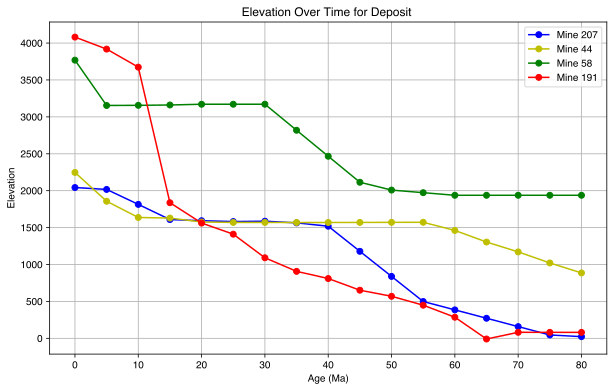

In [48]:
# Specify the deposit number you want to plot
target_deposit_number1 = mine1+1  # Replace with your desired deposit number
target_deposit_number2 = mine2+1  # Replace with your desired deposit number
target_deposit_number3 = mine3+1  # Replace with your desired deposit number
target_deposit_number4 = mine4+1  # Replace with your desired deposit number


# Filter the data for the specified deposit number
filtered_data1 = allminedataB_pd[allminedataB_pd['Deposit number'] == target_deposit_number1]
filtered_data2 = allminedataB_pd[allminedataB_pd['Deposit number'] == target_deposit_number2]
filtered_data3 = allminedataB_pd[allminedataB_pd['Deposit number'] == target_deposit_number3]
filtered_data4 = allminedataB_pd[allminedataB_pd['Deposit number'] == target_deposit_number4]

# Convert the filtered data to numpy arrays
age = filtered_data1['Age'].to_numpy()
elevation1 = filtered_data1['Elevation'].to_numpy()
elevation2 = filtered_data2['Elevation'].to_numpy()
elevation3 = filtered_data3['Elevation'].to_numpy()
elevation4 = filtered_data4['Elevation'].to_numpy()


# Create a line plot of elevation over time
plt.figure(figsize=(10, 6))
plt.plot(age, elevation1, marker='o', linestyle='-', color='b', label='Mine '+str(target_deposit_number1))
plt.plot(age, elevation2, marker='o', linestyle='-', color='y', label='Mine '+str(target_deposit_number2))
plt.plot(age, elevation3, marker='o', linestyle='-', color='g', label='Mine '+str(target_deposit_number3))
plt.plot(age, elevation4, marker='o', linestyle='-', color='r', label='Mine '+str(target_deposit_number4))

plt.xlabel('Age (Ma)')
plt.ylabel('Elevation')
plt.title(f'Elevation Over Time for Deposit ')
plt.legend()
plt.grid(True)
plt.show()

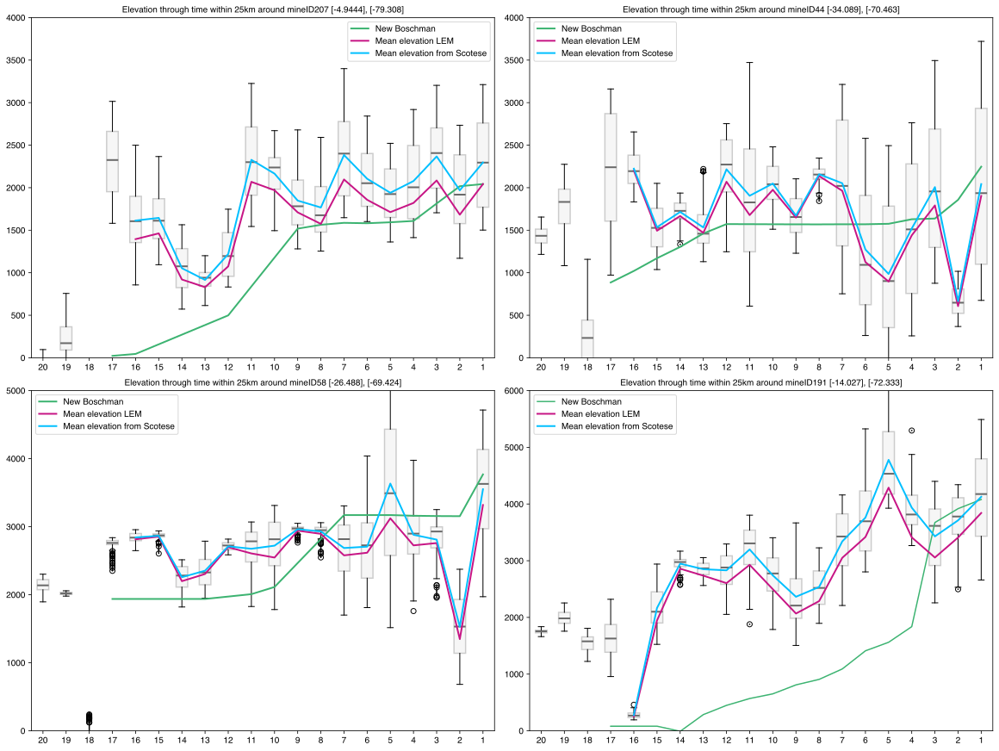

In [42]:
# Create the figure and axes
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12), constrained_layout=True)

# Box plot for the first subplot (ax1)
ax1.boxplot(reshaped_df1,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightgray', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgrey', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)

# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax1.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax1.plot((age/5)+1, elevation1, marker='o', linestyle='-', color='mediumseagreen',label='New Boschman', markersize=0, linewidth=2)

ax1.plot((tvals/5+1), elev_sim_mean1, marker='o', label='Mean elevation LEM', linestyle='-',  color='mediumvioletred', markersize=0, linewidth=2)
ax1.plot((tvals/5+1), elev_scotese_mean1, marker='o',  label='Mean elevation from Scotese', linestyle='-', color='deepskyblue', markersize=0, linewidth=2)
# ax1.plot((tvals/5+1), elv_mean_boschman1, marker='o',  label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis1 = ax1.axes.get_xaxis()
ax1.invert_xaxis()
ax1.set_title('Elevation through time within 25km around mineID'+str(mine1+1)+' '+str(SAlat1)+', '+str(SAlon1), fontsize=10)
ax1.set_ylim(0, 4000) # Change the limits as needed
ax1.legend()

# Box plot for the second subplot (ax2)
ax2.boxplot(reshaped_df2,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightgray', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgray', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)

# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax2.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax2.plot((age/5)+1, elevation2, marker='o', linestyle='-', color='mediumseagreen', label='New Boschman', markersize=0, linewidth=2)

ax2.plot((tvals/5+1), elev_sim_mean2,  label='Mean elevation LEM', linestyle='-',  color='mediumvioletred', markersize=0, linewidth=2)
ax2.plot((tvals/5+1), elev_scotese_mean2,  label='Mean elevation from Scotese', linestyle='-', color='deepskyblue', markersize=0, linewidth=2)
# ax2.plot((tvals/5+1), elv_mean_boschman2, label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis2 = ax2.axes.get_xaxis()
ax2.invert_xaxis()
ax2.set_title('Elevation through time within 25km around mineID'+str(mine2+1)+' '+str(SAlat2)+', '+str(SAlon2), fontsize=10)
ax2.set_ylim(0, 4000)
ax2.legend()

# Box plot for the third subplot (ax3)
ax3.boxplot(reshaped_df3,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightgray', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgray', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)
# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax3.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax3.plot((age/5)+1, elevation3, marker='o', linestyle='-', color='mediumseagreen', label='New Boschman', markersize=0, linewidth=2)

ax3.plot((tvals/5+1), elev_sim_mean3, marker='o',  label='Mean elevation LEM', linestyle='-',  color='mediumvioletred', markersize=0, linewidth=2)
ax3.plot((tvals/5+1), elev_scotese_mean3, marker='o',  label='Mean elevation from Scotese', linestyle='-', color='deepskyblue', markersize=0 , linewidth=2)
# ax3.plot((tvals/5+1), elv_mean_boschman3, marker='o',  label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis3 = ax3.axes.get_xaxis()
ax3.invert_xaxis()
ax3.set_title('Elevation through time within 25km around mineID'+str(mine3+1)+' '+str(SAlat3)+', '+str(SAlon3), fontsize=10)
ax3.set_ylim(0, 5000)
ax3.legend()

# Box plot for the fourth subplot (ax4)
ax4.boxplot(reshaped_df4,
            vert=True, patch_artist=True,
            boxprops=dict(facecolor='lightgray', color='Black', linestyle='-', alpha=0.2, linewidth=1.5),
            medianprops=dict(color='dimgray', linestyle='-', linewidth=2),
            flierprops=dict(linestyle='-', linewidth=1.5),
            whiskerprops=dict(linestyle='-', linewidth=1),
            capprops=dict(linestyle='-', linewidth=1),
            zorder=1)
# Set x-axis labels to match 5 Ma steps with "Ma" suffix
# ax4.set_xticklabels([str(t) + 'Ma' for t in tvals], rotation=45, ha="right")
ax4.plot((age/5)+1, elevation4, marker='o', linestyle='-', color='mediumseagreen', label='New Boschman', markersize=0)

ax4.plot((tvals/5+1), elev_sim_mean4, marker='o', label='Mean elevation LEM', linestyle='-',  color='mediumvioletred', markersize=0, linewidth=2)
ax4.plot((tvals/5+1), elev_scotese_mean4, marker='o', label='Mean elevation from Scotese', linestyle='-', color='deepskyblue', markersize=0, linewidth=2)
# ax4.plot((tvals/5+1), elv_mean_boschman4, marker='o', label='Mean elevation from Boschman', linestyle='--', color='darkolivegreen', markersize=2, linewidth=2)
x_axis4 = ax4.axes.get_xaxis()
ax4.invert_xaxis()
ax4.set_title('Elevation through time within 25km around mineID'+str(mine4+1)+' '+str(SAlat4)+', '+str(SAlon4), fontsize=10)
ax4.set_ylim(0, 6000)
ax4.legend()

# You can further customize the subplots, labels, titles, etc.

# # Save the plot as an image
# plt.savefig('combined_ElevationxTime_radius1_25km.png', transparent=False, dpi=300)
plt.savefig('ElevationxTime_mines_n'+str(mine1+1)+'_'+str(mine2+1)+'_'+str(mine3+1)+'_'+str(mine4+1)+'.svg', transparent=False, dpi=300)
plt.savefig('ElevationxTime_mines_'+str(mine1+1)+'_'+str(mine2+1)+'_'+str(mine3+1)+'_'+str(mine4+1)+'.png', transparent=False, dpi=300)


# # Show the plot (if needed)
plt.show()
